# Init Stuff

In [1]:
pip install IMDbPY

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 301 kB 5.3 MB/s 


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
import imdb
from PIL import Image
import urllib.request

In [3]:
!gdown https://drive.google.com/uc?id=1rpSEjZFQCE8dS9RKQzpxI7qW-mFveA12

Downloading...
From: https://drive.google.com/uc?id=1rpSEjZFQCE8dS9RKQzpxI7qW-mFveA12
To: /content/NetflixHistory.csv
100% 2.13M/2.13M [00:00<00:00, 121MB/s]


In [4]:
df = pd.read_csv('NetflixHistory.csv')

In [5]:
IMDB = imdb.IMDb()

# Dataset Modifications

**Normalizar a segundos.**

In [7]:
def get_sec(time_str):
    h, m, s = time_str.split(':')
    return int(h) * 3600 + int(m) * 60 + int(s)

df['Duration']=df['Duration'].apply(get_sec) 

La funcion get_sec recibe una unidad de tiempo de la forma hh:mm:ss, la transforma en segundos y la devuelve.

Despues se hace un mapping de esa funcion con todos los registros de tiempo.

**Sacar dispositivos no permitidos.**



In [8]:
prohibenDevices = [
    'Sony PS4', 
    'Netflix Windows App - Cadmium Windows Mobile', 
    'Apple iPhone 6s', 
    'Apple iPhone 7 Plus (CDMA)', 
    'Chrome PC (Cadmium)', 
    'Samsung 2015 NT14M DTV Smart TV', 
    'iPhone 5S GSM', 
    'Google Chromecast V3 Streaming Stick'
]

for item in prohibenDevices:
  df.drop(df[df['Device Type'] == item].index, inplace = True)

Creo una lista con todos los dispositivos prohibidos, despues borro todos los registros del dataframe donde "Device Type" es igual al elemento que este en "item" en ese momento.

**Agregar una columna de clasificaicon por series o peliculas y excluyendo hooks y trailers.**

In [9]:
def TitleType(input):
  if "hook" in input or "Trailer" in input or "Tráiler" in input or "Clip" in input:
    return "Otro"
  elif input.count(":") >= 2:
    return "Serie"
  elif input.count(":") <= 1:
    return "Pelicula"

df["Type"] = df["Title"].apply(TitleType)

Hago la funcion "TitleType" que checkee, 1) que el registro no sea un hook o trailer revisando si contiene ese texto literal. 2) Que sea una serie o pelicula viendo la catidad de ":" que hay en el titulo, si tiene 2 o mas es una serie y sino es una pelicula.

**Agregar una columna con el nombre de la serie para que sea mas iterable**

Uso la misma idea que cuando agregamos la columna "Type", solo que en el caso de que sea una serie, uso la funcion split() para sacar solamente el nombre de la serie y guardardo en la columna "TitleName". Si no es una serie pego el titulo en la columna para no dejarla vacia.

In [10]:
def TitleName(input):
  if "hook" in input or "Trailer" in input or "Tráiler" in input or "Clip" in input:
    return input
  elif input.count(":") >= 2:
    return input.split(":")[0]
  elif input.count(":") <= 1:
    return input

df["TitleName"] = df["Title"].apply(TitleName)

**Agregar columnas de fecha para que sea mas comodo hacer el promedio**

In [11]:
def yearColumn(input):
  date = datetime.strptime(input, '%Y-%m-%d %H:%M:%S')
  date = (date.strftime("%Y-%B-%A-%d %H:%M:%S"))
  res = ""

  for a in date:
    if a == "-" or a == " " or a == ":":
      res += "."
    else: 
      res += a

  res = res.split(".")

  return res[0]

In [12]:
def monthColumn(input):
  date = datetime.strptime(input, '%Y-%m-%d %H:%M:%S')
  date = (date.strftime("%Y-%B-%A-%d %H:%M:%S"))
  res = ""

  for a in date:
    if a == "-" or a == " " or a == ":":
      res += "."
    else: 
      res += a

  res = res.split(".")

  return res[1]

In [13]:
def dayColumn(input):
  date = datetime.strptime(input, '%Y-%m-%d %H:%M:%S')
  date = (date.strftime("%Y-%B-%A-%d %H:%M:%S"))
  res = ""

  for a in date:
    if a == "-" or a == " " or a == ":":
      res += "."
    else: 
      res += a

  res = res.split(".")

  return res[2]

In [14]:
def hourColumn(input):
  date = datetime.strptime(input, '%Y-%m-%d %H:%M:%S')
  date = (date.strftime("%Y-%B-%A-%d %H:%M:%S"))
  res = ""

  for a in date:
    if a == "-" or a == " " or a == ":":
      res += "."
    else: 
      res += a

  res = res.split(".")

  return res[4]

In [15]:
df["Year"] = df["Start Time"].apply(yearColumn)
df["Month"] = df["Start Time"].apply(monthColumn)
df["Day"] = df["Start Time"].apply(dayColumn)
df["Hour"] = df["Start Time"].apply(hourColumn)

# Ejercicios

Ignorar los siguientes dispositivos: 

'Sony PS4', 'Netflix Windows App - Cadmium Windows Mobile', 'Apple iPhone 6s', 'Apple iPhone 7 Plus (CDMA)', 'Chrome PC (Cadmium)', 'Samsung 2015 NT14M DTV Smart TV', 'iPhone 5S GSM', 'Google Chromecast V3 Streaming Stick'.

**Normalizar los tiempos a segundos**

**a) Contabilizar el dispositivo con el que más títulos se reprodujeron.**

**b) Encontrar la película con más ocurrencias y la película con mayor duración total.**

**c) Generar un TOP “N” de series vistas y graficar.**
    
    i)Por tiempo visto

    ii)Por ocurrencias

**d) Visualizar una semana de reproducciones genérica, en función a las reproducciones por día y por horario de todos los años.**

**e) Contabilizar la cantidad de títulos vistos por año, graficar su variación a través de los años.**

**f) Total de días de todos los títulos reproducidos.**



Bonus: 

1. **Identificar cuál fue la película de Star Wars más veces vista por duración.**
2. Utilizando la API de IMDb (u otra):

    a. Mostrar el póster de las películas más vistas, y de las series.

    b. Encontrar el género de series y el de películas más ocurrente.
3. Encontrar la serie que más rápido se terminó de ver.


# EJA

Hice el diccionario donde voy a tener como key el nombre del dispositivo y value la cantidad de titulos reproducidos.

Recorro todos los dispositivos y agarrando la cantidad de registros que tiene y los voy poniendo en el diccionario, una vez que tengo todo hecho agarro la key que se corresponda con el value mas grande del diccionario y lo guardo en "Keymax".

Finalmente printeo el nombre del dispositivo ("Keymax"), y el valor buscando en el diccionario con la key "Keymax".

In [16]:
totalRows = {}

for item in df[df["Device Type"] != None]["Device Type"].unique():
  totalRows[item] = len(df[df["Device Type"]==item])
  
Keymax = max(zip(totalRows.values(), totalRows.keys()))[1]

print("El dispositivo con mas titulos reproducidos es:", Keymax, "con", totalRows[Keymax], "titulos!")


El dispositivo con mas titulos reproducidos es: Apple Apple TV 4 Apple TV con 3519 titulos!


#EJB

**Pelicula con mas ocurrencias.**


Creo un diccionario.


Recorro todos los titulos de las peliculas haciendo que me muestre el titulo para cuando "Type" sea "Pelicula". No me salen peliculas duplicadas ya que uso la funcion unique().

Adentro de esa iteracion, creo un registro en el diccionario con key, el nombre de la pelicula y value la cantidad de veces que aparaece en el dataframe.

Una vez que tengo el dicionario hecho, agarro la key con el value mas grande, osea la mayor cantidad de veces que aparece en el dataframe. Si hay mas de una key con el mismo value, se muetra igual.

Finalmente, muestro los datos por print.

In [17]:
movieDic = {}

for item in df[df["Type"] == "Pelicula"]["Title"].unique():
  movieDic[item] = df[df["Title"] == item]["Title"].value_counts()[0]

keys = [k for k, v in movieDic.items() if v == max(movieDic.values())]

for a in range(len(keys)):
  print("Pelicula: ", keys[a], "| Cantidad de ocurrencias: ", movieDic[keys[a]])

Pelicula:  Star Wars: El Imperio contraataca | Cantidad de ocurrencias:  7
Pelicula:  El código enigma | Cantidad de ocurrencias:  7


**Pelicula con mayor duracion**

Busco la mayor duracion dentro de las peliculas iterando por todos los registros donde "Type" es "Pelicula", usando la funcion max() para agarrar efectivamente la duracion mas grande.

Despues agarro todos los nombres de las peliculas donde la duracion sea la que encontre en la linea anterior y guardo los nombres en la lista "movieName".

Finalmente hago un FOR que recorra esa lista y muestre los numeros junto a la duracion que saque al principio del desarrollo del problema.

In [18]:
maxTime = 0
bestMovie = ""

for item in df[df["Type"] == "Pelicula"]["Title"].unique():
  secondsViewed = df[df["Title"] == item]["Duration"].sum()
  if secondsViewed > maxTime:
    maxTime = secondsViewed
    bestMovie = item

print("Pelicula: ", bestMovie, "| Segundos vista: ", maxTime)

Pelicula:  Star Wars: El Imperio contraataca | Segundos vista:  29433


# EJC

**PASO OTRA VEZ, HICE ALGO QUE NO ERA EL EJERCICIO** 😎

Esto te hace un top "N" de capitulos mas vistos en base a cantidad de tiempo visto.

Primero agarro el size del top con un input. Despues creo un diccionario, recorro todos los capitulos de las series y cargo el diccionario con key, el nombre del capitulo y value la suma de todo el tiempo visto.

Para agarrar los 5 capitulos mas vistos hago un FOR que se repite la cantidad de veces puesta en el input. Adentro agarro el value mas grande del diccionario y la key que corresponde a ese value, lo muestro y borro ese registro del diccionario para poder hacer indefinidamente lo mismo que me vaya mostrando en orden descendiente los capitulos mas vistos hasta llegar a "N"

In [19]:
cantTiers = int(input("Igresar un numero: "))

seriesDic = {}

for item in df[df["Type"] == "Serie"]["Title"].unique():
  seriesDic[item] = df[df["Title"] == item]["Duration"].astype(int).sum()

for a in range(cantTiers):
  maxValue = max(seriesDic.values())
  maxValueName = [k for k, v in seriesDic.items() if v == max(seriesDic.values())]

  print("TOP",a+1,maxValueName[0],". Con un tiempo visto de: ",maxValue, "segundos")

  seriesDic.pop(str(maxValueName[0]))


Igresar un numero: 5
TOP 1 La ley de los audaces: Temporada 1: Piloto (Partes 1 y 2) (Capítulo 1) . Con un tiempo visto de:  19496 segundos
TOP 2 Community: Temporada 6: Espionaje moderno (Capítulo 11) . Con un tiempo visto de:  16836 segundos
TOP 3 Doctor Who: Temporada 4: Las aguas de Marte (Capítulo 17) . Con un tiempo visto de:  11076 segundos
TOP 4 Community: Temporada 6: Consecuencias emocionales de las transmisiones televisivas (Capítulo 13) . Con un tiempo visto de:  11074 segundos
TOP 5 Community: Temporada 6: Temas homosexuales y lustrado avanzado (Capítulo 4) . Con un tiempo visto de:  10987 segundos


---

**Ahora Si, Este es el EJC i)**

Fue bastante parecido a lo que esta arriba. Agarro la cantidad de tiers con el input, creo un nuevo diccionario, lo cargo recorriendo todas las series y agarrando el nombre de la serie mediante la columna que agregamos aparte del .csv original.

Una vez que tengo el diccionario cargado con el nombre de la serie y la suma de segundos vistos por cada una, hago 2 listas para despues poder hacer el grafico, donde guardo los nombres de las series y el tiempo visto.

Despues hago un FOR que se repita la cantidad de veces puesta en el input, que agarre el valor mas grande del diccionario y su nombre correspondiente, lo guarde en la lista en la que debe estar y borre ese registro del diccionario para poder buscar el siguiente valor mas grande.

Finalmente grafico todos esos datos puestos en las listas.

Igresar un numero: 5


Text(0.5, 1.0, 'TOP 5 Series vistas por Chona segun cantidad de tiempo visto')

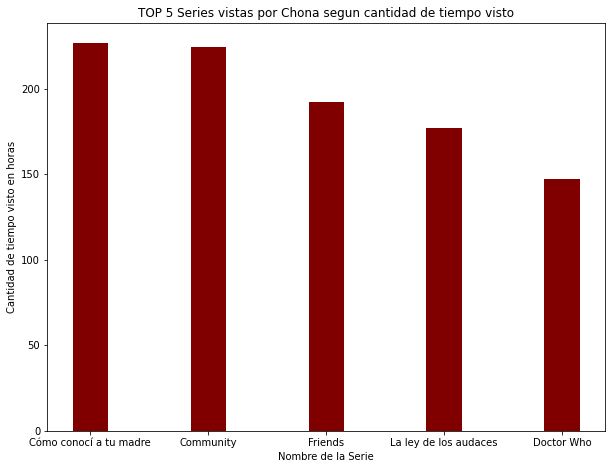

In [20]:
#Get the amount of tiers
cantTiers = int(input("Igresar un numero: "))

#Filling dictionary with all series and watched time
SeriesWTDic = {}

for item in df[df["Type"] == "Serie"]["TitleName"].unique():
  SeriesWTDic[item] = df[df["TitleName"] == item]["Duration"].astype(int).sum()

#Getting the top N of series and filling it to lists
SeriesWTName = []
SeriesWTTime = []

for a in range(cantTiers):
  maxValue = max(SeriesWTDic.values())
  maxValueName = [k for k, v in SeriesWTDic.items() if v == max(SeriesWTDic.values())]

  SeriesWTName.append(str(maxValueName[0]))
  SeriesWTTime.append(maxValue / 3600)

  SeriesWTDic.pop(str(maxValueName[0]))

#Plotting data from lists

fig = plt.figure(figsize = (cantTiers*2, cantTiers*1.5))

plt.bar(SeriesWTName, SeriesWTTime, color ='maroon', width = 0.3)

plt.xlabel("Nombre de la Serie")
plt.ylabel("Cantidad de tiempo visto en horas")
plt.title("TOP "+ str(cantTiers) +" Series vistas por Chona segun cantidad de tiempo visto")

**EJC ii)**

Agarro la cantidad de tiers con el input, creo un nuevo diccionario, lo cargo recorriendo todas las series y agarrando el nombre de la serie mediante la columna que agregamos aparte del .csv original.

Una vez que tengo el diccionario cargado con el nombre de la serie y la cantidad de ocurrencias por cada una, hago 2 listas para despues poder hacer el grafico, donde guardo los nombres de las series y la cantidad de registros encontrados.

Despues hago un FOR que se repita la cantidad de veces puesta en el input, que agarre el valor mas grande del diccionario y su nombre correspondiente, lo guarde en la lista en la que debe estar y borre ese registro del diccionario para poder buscar el siguiente valor mas grande.

Finalmente grafico todos esos datos puestos en las listas.


Igresar un numero: 5


Text(0.5, 1.0, 'TOP 5 Series vistas por Chona segun cantidad de capitulos vistos')

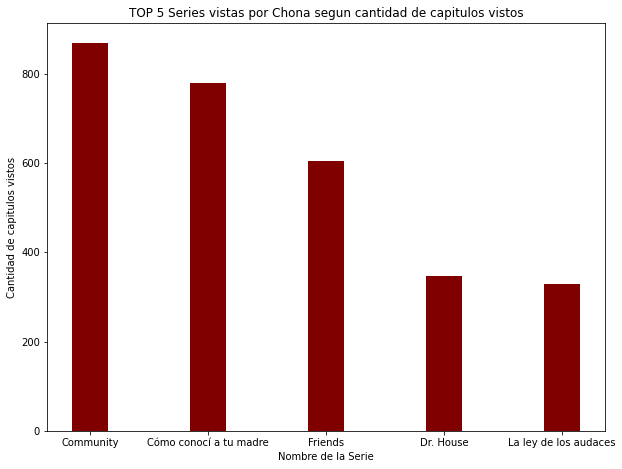

In [21]:
#Get the amount of tiers
cantTiers = int(input("Igresar un numero: "))

#Filling dictionary with all series and watched time
SeriesOcDic = {}

for item in df[df["Type"] == "Serie"]["TitleName"].unique():
  SeriesOcDic[item] = df[df["TitleName"] == item]["Duration"].count()

#Getting the top N of series and filling it to lists
SeriesOcName = []
SeriesOcurrences = []

for a in range(cantTiers):
  maxValue = max(SeriesOcDic.values())
  maxValueName = [k for k, v in SeriesOcDic.items() if v == max(SeriesOcDic.values())]

  SeriesOcName.append(str(maxValueName[0]))
  SeriesOcurrences.append(maxValue)

  SeriesOcDic.pop(str(maxValueName[0]))

#Plotting data from lists

fig = plt.figure(figsize = (cantTiers*2, cantTiers*1.5))

plt.bar(SeriesOcName, SeriesOcurrences, color ='maroon', width = 0.3)

plt.xlabel("Nombre de la Serie")
plt.ylabel("Cantidad de capitulos vistos")
plt.title("TOP "+ str(cantTiers) +" Series vistas por Chona segun cantidad de capitulos vistos")

# EJD

Creo un nuevo dataframe para graficar

In [22]:
dfEjD = pd.DataFrame()

Agrego una columna "Day" para despues poder cargar los valores mas comodo, tambien creo una lista con horas para despues agregar las columnas de las horas donde voy a poner los datos, tambien un diccionario para referirse a cada dia de la semana por su index en el dataframe.

Tambien lleno los valores vacios con ceros para despues modificarlos.

In [23]:
dayLis = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
dfEjD["Day"] = dayLis

hourLis = ["00", "02", "04", "06", "08", "10", "12", "14", "16", "18", "20", "22"]
for hour in hourLis:
  dfEjD[hour] = 0

dayHourDic = {
    "Monday":0,
    "Tuesday":1,
    "Wednesday":2,
    "Thursday":3,
    "Friday":4,
    "Saturday":5,
    "Sunday":6
}

Uso dos FOR, uno para recorrer todas las horas y otro para los dias de la semana en el dataframe. Por cada registro, hago que el valor que se refiera a un cierto dia a una cierta hora sea igual a la cantidad de registros que aparecen en el dataframe original en ese cierto dia y esa cierta hora. Ahora tengo el dataframe lleno.

In [24]:
for hour in hourLis:
  for day in dfEjD[dfEjD["Day"] != None]["Day"]:
    dfEjD.at[dayHourDic[day], hour] = df.loc[(df['Day'] == day) & (df["Hour"] == hour)].count()[0]

Para poder hacer el heatmap necesito borrar la columna dia.

In [25]:
dfEjD = dfEjD.drop('Day', axis=1)

Hago el heatmap

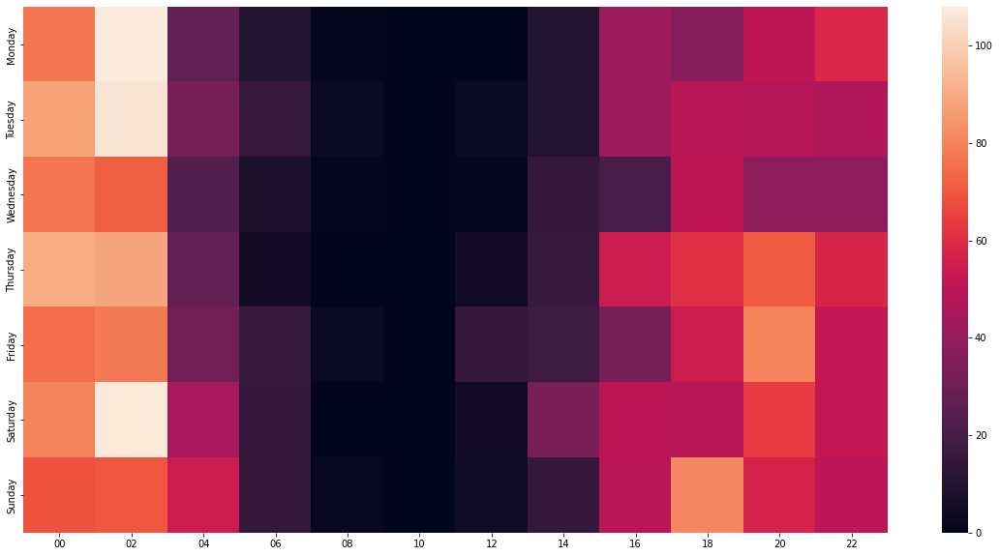

In [26]:
plt.figure(figsize = (20,10))

sns.heatmap(dfEjD, yticklabels=dayLis)

# EJE

Creo un diccionario con todos los años segun lo que me dijo chona con key los años y value la cantidad de titulos que aparece, creo tambien una lista con los años para poder graficar mas adelante.

Recorro todos los titulos y sumo 1 al registro del diccionario donde el año sea el año del titulo visto, todo esto me carga el diccionario. Despues paso los valores a otra lista para poder graficar.

In [27]:
yearDic = {
    "2015":0,
    "2016":0,
    "2017":0,
    "2018":0,
    "2019":0,
    "2020":0,
    "2021":0,
    "2022":0
}

yearLis = ["2015","2016","2017","2018","2019","2020","2021","2022"]
yearValueLis = []

for item in df[df["Year"] != None]["Year"]:
  yearDic[item] += 1

for value in yearDic.values():
  yearValueLis.append(value)

🤑 Grafico 🤑

Text(0.5, 1.0, 'Cantidad de titulos vistos a lo largo de los años')

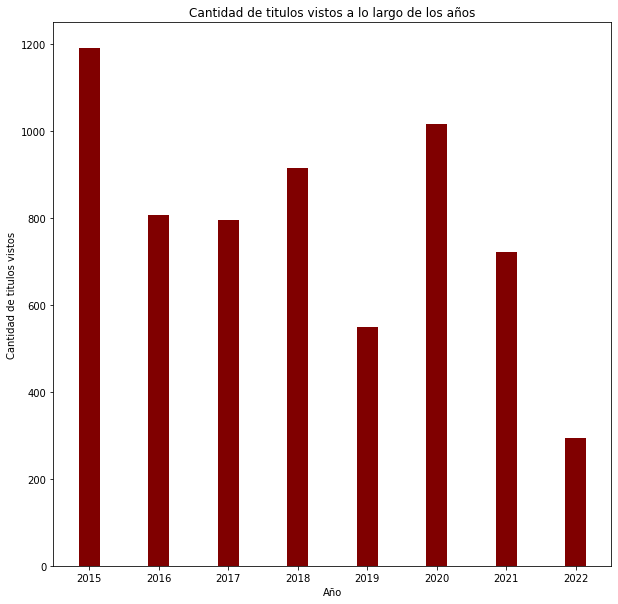

In [28]:
fig = plt.figure(figsize = (10, 10))
plt.bar(yearLis, yearValueLis, color ='maroon', width = 0.3)
plt.xlabel("Año")
plt.ylabel("Cantidad de titulos vistos")
plt.title("Cantidad de titulos vistos a lo largo de los años")

# EJF

Recorro todos los titulos y voy sumando la duracion, despues la convierto a dias y lo printeo.

In [29]:
cantSegundos = 0

for item in df[df["Title"] != None]["Duration"]:
  cantSegundos += int(item)

round(cantSegundos / 60 / 60 / 24, 2)

99.78

# 😎 BONUS 😎

### 1)

Creo un diccionario, recorro todos los titulos que contengan "Star Wars", por cada registro, hago que en el diccionario, en la posicion del nombre de la peli, el value sea la suma de segundos. 

Despues agarro el nombre, el valor y los muestro.

In [30]:
starWarsDic = {}

for item in df[df["Type"] == "Pelicula"]["Title"]:
  if "Star Wars" in item:
    starWarsDic[item] = df[df["Title"] == item]["Duration"].sum().max()

maxValueName = [k for k, v in starWarsDic.items() if v == max(starWarsDic.values())]
maxValue = round(max(starWarsDic.values()) / 3600, 2)

print("La pelicula de Star Wars mas vista es |", maxValueName[0], "| Con un tiempo visto de |",maxValue,"| Horas")

La pelicula de Star Wars mas vista es | Star Wars: El Imperio contraataca | Con un tiempo visto de | 8.18 | Horas


###2)
Agarra mal las cosas del id

In [31]:
def getMovieURL(movieName):
  search = IMDB.search_movie(movieName)

  id = search[0].movieID

  movie = IMDB.get_movie(id)

  return movie["full-size cover url"]

Igresar un numero: 5


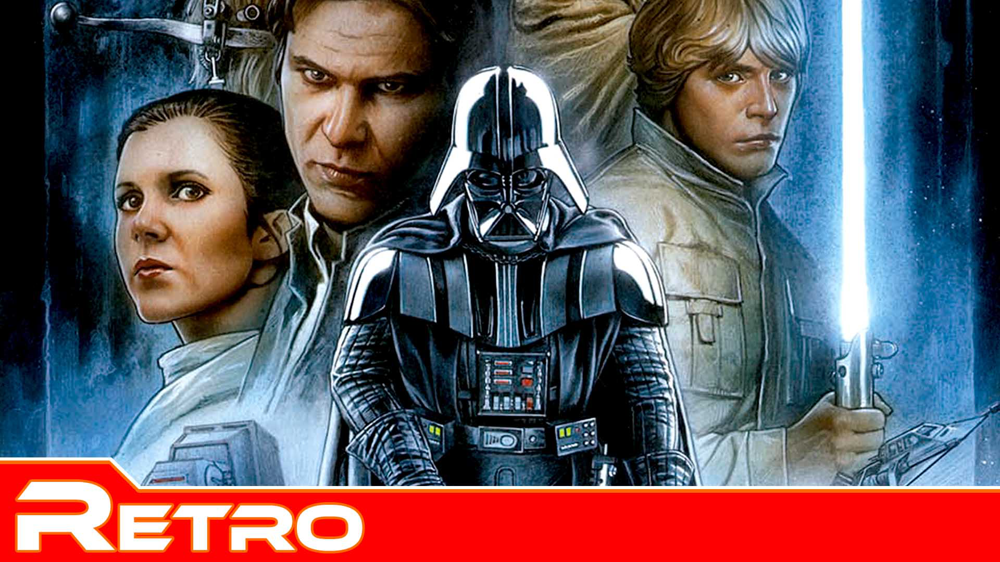

OSError: ignored

<PIL.JpegImagePlugin.JpegImageFile image mode=CMYK size=1382x2048 at 0x7F11C1851450>

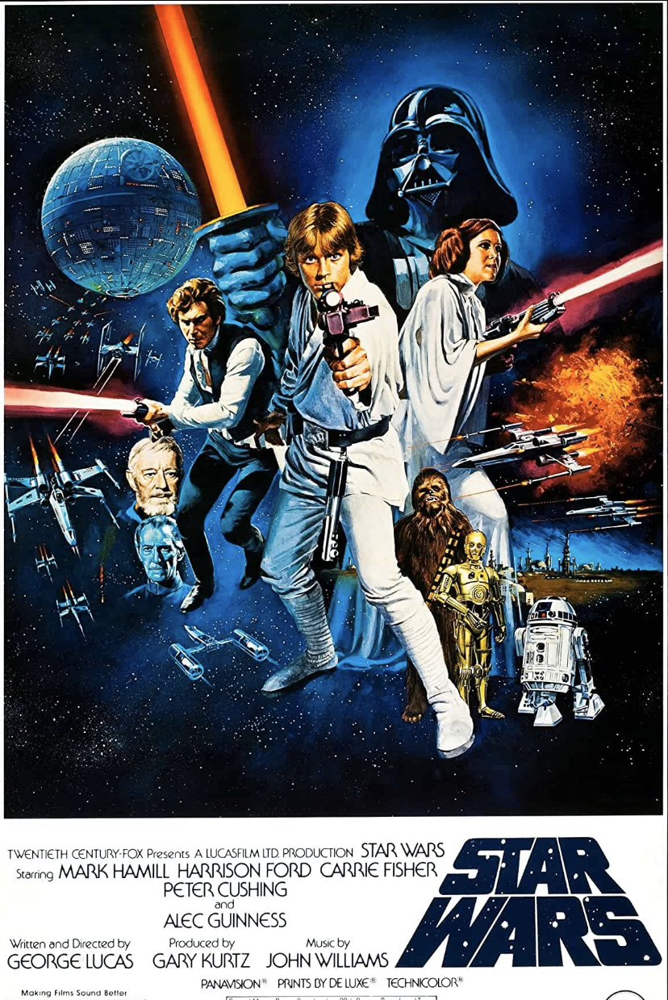

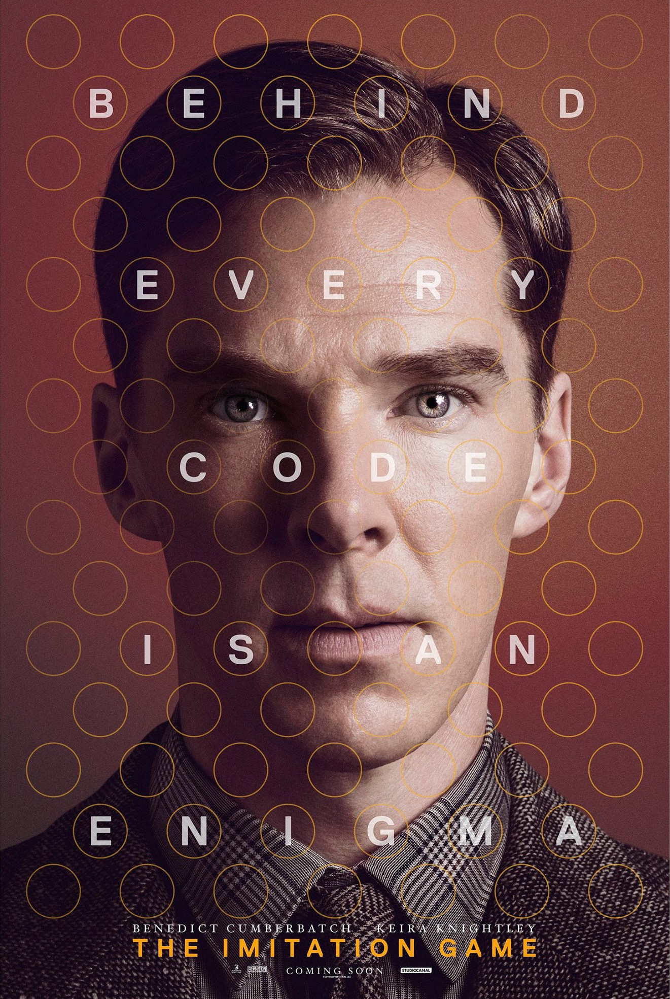

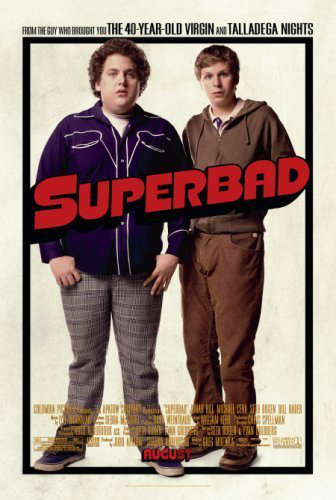

In [32]:
cantTiers = int(input("Igresar un numero: "))

pelisDic = {}

for item in df[df["Type"] == "Pelicula"]["Title"].unique():
  pelisDic[item] = df[df["Title"] == item]["Duration"].astype(int).sum()

for a in range(cantTiers):
  maxValue = max(pelisDic.values())
  maxValueName = [k for k, v in pelisDic.items() if v == max(pelisDic.values())]

  urllib.request.urlretrieve(getMovieURL(maxValueName[0]),"gfg.png")
  img = Image.open("gfg.png")
  display(img)

  pelisDic.pop(str(maxValueName[0]))

Igresar un numero: 5


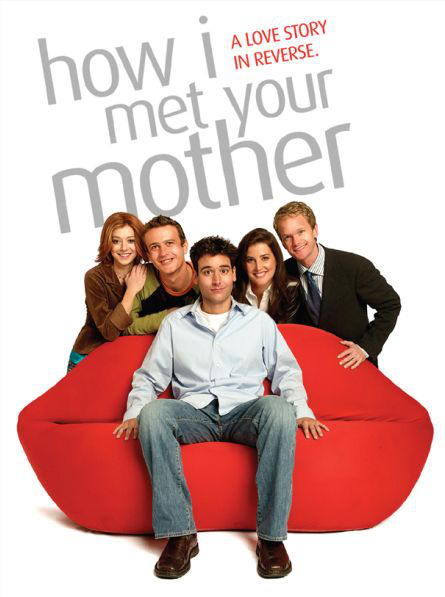

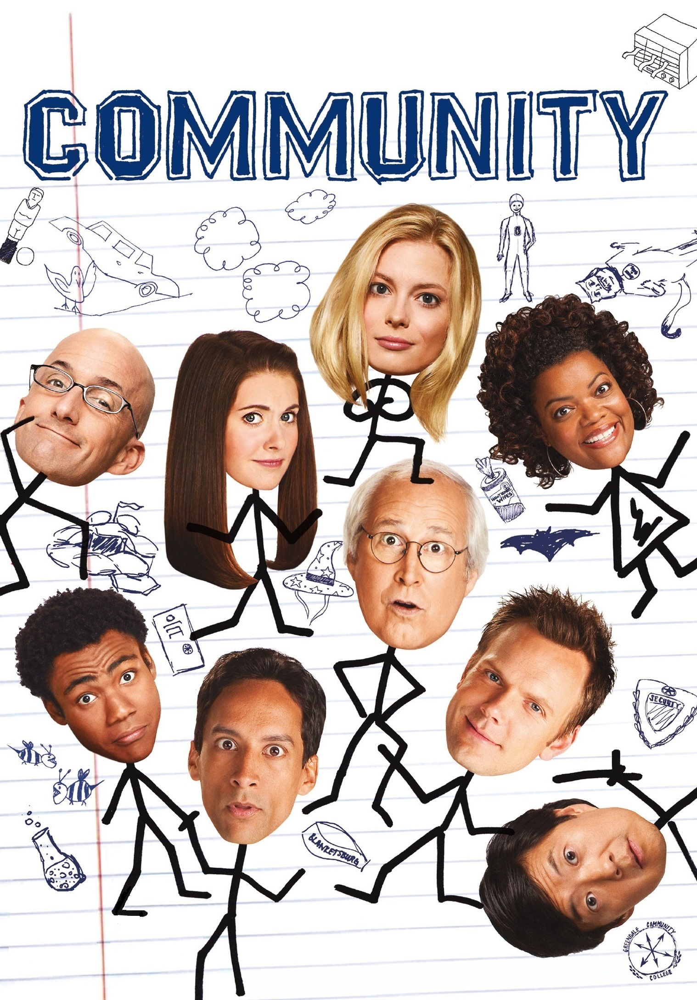

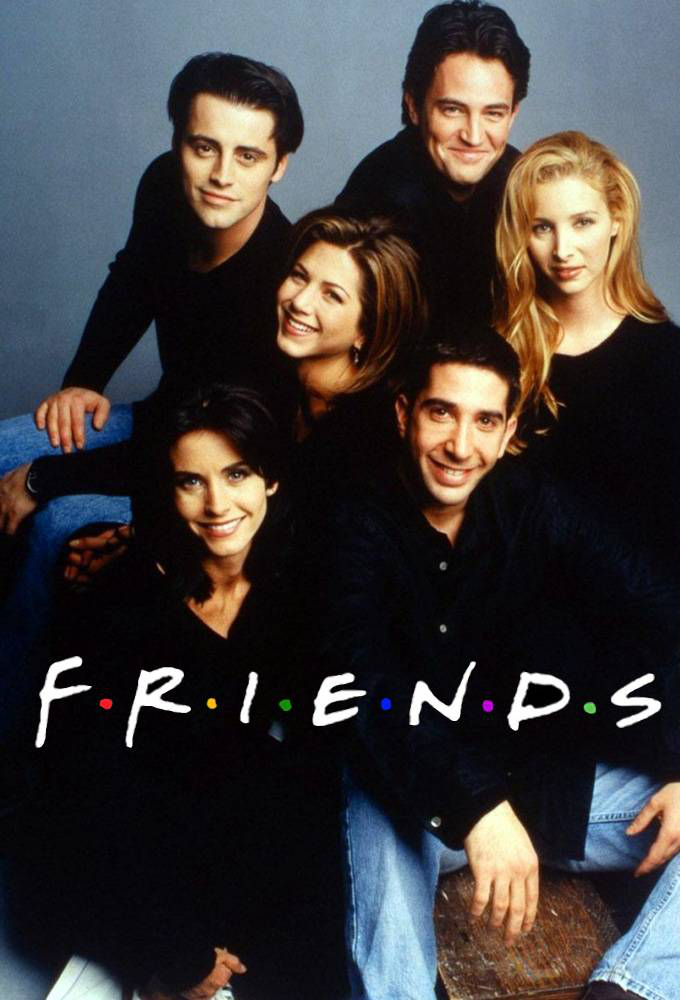

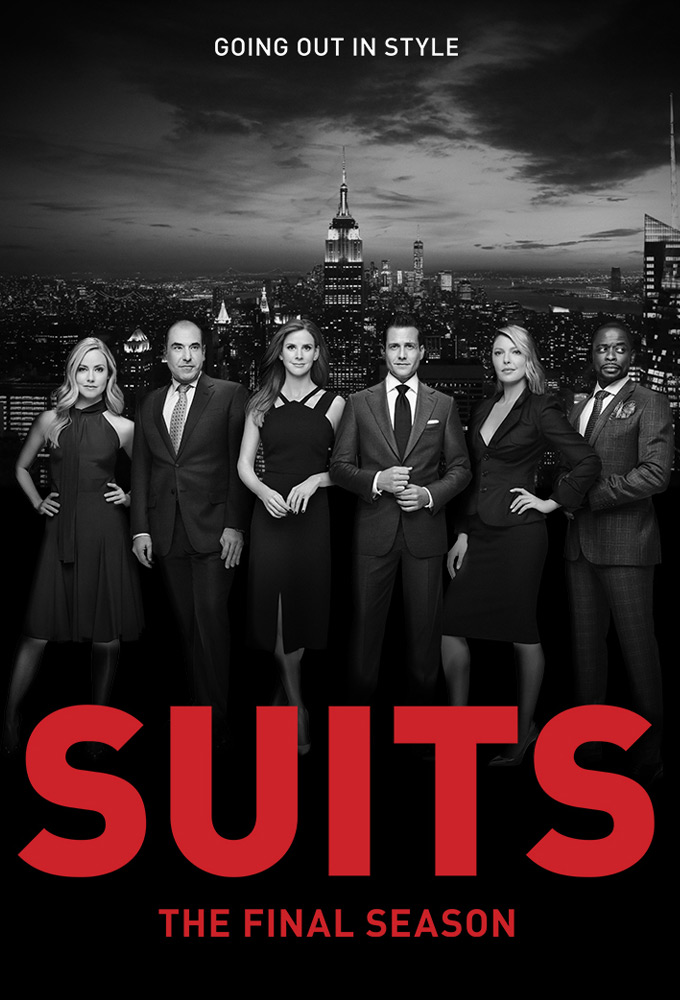

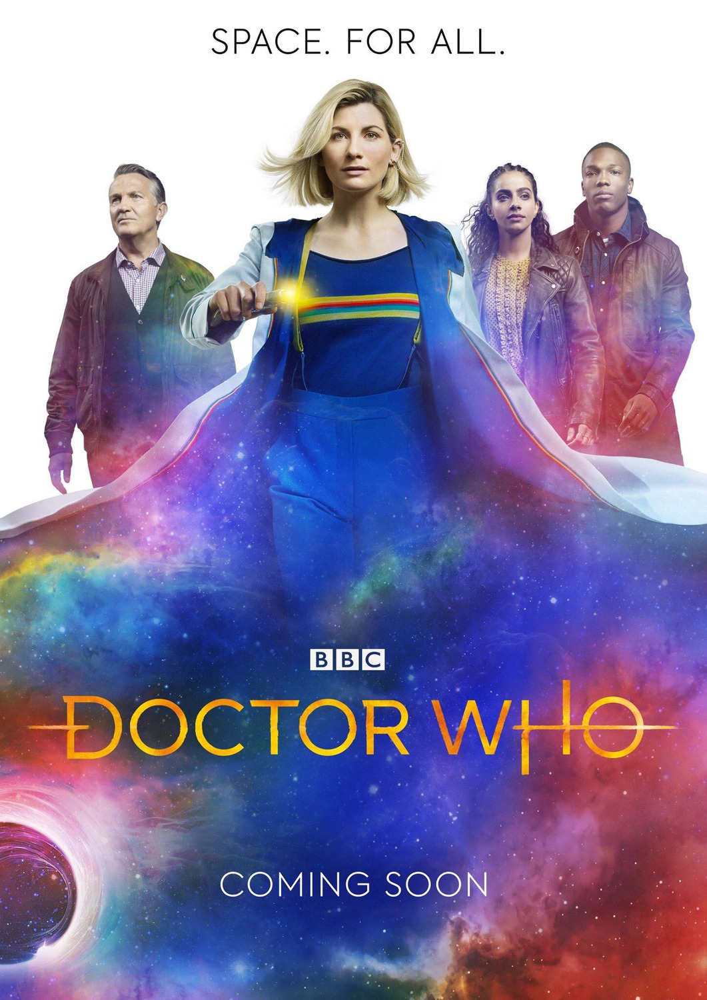

In [33]:
cantTiers = int(input("Igresar un numero: "))

seriesDic = {}

for item in df[df["Type"] == "Serie"]["TitleName"].unique():
  seriesDic[item] = df[df["TitleName"] == item]["Duration"].astype(int).sum()

for a in range(cantTiers):
  maxValue = max(seriesDic.values())
  maxValueName = [k for k, v in seriesDic.items() if v == max(seriesDic.values())]

  urllib.request.urlretrieve(getMovieURL(maxValueName[0]),"gfg.png")
  img = Image.open("gfg.png")
  display(img)


  seriesDic.pop(str(maxValueName[0]))